install python version between 3.8~3.11, or it may be wrong.

You can find more information from here:

https://allensdk.readthedocs.io/en/latest/visual_coding_neuropixels.html

Because the full dataset is large, we provide 5 sessions for you to explore (1 with LFP data).

# Accessing Neuropixels Visual Coding Data

## Tutorial overview

This Jupyter notebook covers the various methods for accessing the Allen Institute Neuropixels Visual Coding dataset. We will go over how to request data, where it's stored, and what the various files contain.  If you're having trouble downloading the data, or you just want to know more about what's going on under the hood, this is a good place to start.

Currently, we do not have a web interface for browsing through the available cells and experiments, as with the [two-photon imaging Visual Coding dataset](http://observatory.brain-map.org/visualcoding). Instead, the data must be retrieved through the AllenSDK (Python 3.6+), or via requests sent to [api.brain-map.org](http://mouse.brain-map.org/static/api).

Functions related to data analysis will be covered in other tutorials. For a full list of available tutorials, see the [SDK documentation](https://allensdk.readthedocs.io/en/latest/visual_coding_neuropixels.html).

## Options for data access

The **`EcephysProjectCache` object of the AllenSDK** is the easiest way to interact with the data. This object abstracts away the details of on-disk file storage, and delivers the data to you as ready-to-analyze Python objects. The cache will automatically keep track of which files are stored locally, and will download additional files on an as-needed basis. Usually you won't need to worry about how these files are structured, but this tutorial will cover those details in case you want to analyze them without using the AllenSDK (e.g., in Matlab). This tutorial begins with <a href='#Using-the-AllenSDK-to-retrieve-data'>an introduction to this approach</a>.

If you have an **Amazon Web Services (AWS)** account, you can use an `EcephysProjectCache` object to access the data via the Allen Brain Observatory Simple Storage Service (S3) bucket. This is an AWS Public Dataset located at `arn:aws:s3:::allen-brain-observatory` in region `us-west-2`. Launching a Jupyter notebook instance on AWS will allow you to access the complete dataset without having to download anything locally. This includes around 80 TB of raw data files, which are not accessible via the AllenSDK. The only drawback is that you'll need to pay for the time that your instance is running—but this can still be economical in many cases. A brief overview of this approach can be found <a href='#Accessing-data-on-AWS'>below</a>.

A third option is to directly download the data via **api.brain-map.org**. This should be used only as a last resort if the other options are broken or are not available to you. Instructions for this can be found <a href='#Direct-download-via-api.brain-map.org'>at the end of this tutorial</a>.

## Using the AllenSDK to retrieve data

Most users will want to access data via the AllenSDK. This requires nothing more than a Python interpreter and some free disk space to store the data locally.

How much data is there? If you want to download the complete dataset (58 experiments), you'll need 855 GB of space, split across the following files:

1. CSV files containing information about sessions, probes, channels and units (58.1 MB)
2. NWB files containing spike times, behavior data, and stimulus information for each session (146.5 GB total, min file size = 1.7 GB, max file size = 3.3 GB)
3. NWB files containing LFP data for each probe (707 GB total, min file size = 0.9 GB, max file size = 2.7 GB)

Before downloading the data, you must decide where the `manifest.json` file lives. This file serves as the map that guides the `EcephysProjectCache` object to the file locations.

When you initialize a local cache for the first time, it will create the manifest file at the path that you specify. This file lives in the same directory as the rest of the data, so make sure you put it somewhere that has enough space available. 

When you need to access the data in subsequent analysis sessions, you should point the `EcephysProjectCache` object to an _existing_ `manifest.json` file; otherwise, it will try to re-download the data in a new location.

To get started with this approach, first take care of the necessary imports:

In [1]:
import os
import shutil
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from pathlib import Path

from allensdk.brain_observatory.ecephys.ecephys_project_cache import EcephysProjectCache

Next, we'll specify the location of the manifest file. If you're creating a cache for the first time, this file won't exist yet, but it _must_ be placed in an existing data directory. Remember to choose a location that has plenty of free space available.

In [2]:
# output_dir = '/local1/ecephys_cache_dir' # must be updated to a valid
output_dir = './dataset'
DOWNLOAD_COMPLETE_DATASET = False

In [3]:
manifest_path = os.path.join(output_dir, "manifest.json")

Now we can create the cache object, specifying both the local storage directory (the `manifest_path`) and the remote storage location (the Allen Institute data warehouse).

In [4]:
cache = EcephysProjectCache.from_warehouse(manifest=manifest_path)

This will prepare the cache to download four files:

1. `sessions.csv` (7.8 kB)
2. `probes.csv` (27.0 kB)
3. `channels.csv` (6.6 MB)
4. `units.csv` (51.4 MB)

Each one contains a table of information related to its file name. If you're using the AllenSDK, you won't have to worry about how these files are formatted. Instead, you'll load the relevant data using specific accessor functions: `get_session_table()`, `get_probes()`, `get_channels()`, and `get_units()`. These functions return a [pandas DataFrame](https://pandas.pydata.org/pandas-docs/stable/reference/frame.html?highlight=dataframe) containing a row for each item and a column for each metric.

If you are analyzing data without using the AllenSDK, you can load the data using your CSV file reader of choice. However, please be aware the columns in the original file do not necessarily match what's returned by the AllenSDK, which may combine information from multiple files to produce the final DataFrame.

Let's take a closer look at what's in the `sessions.csv` file:

In [5]:
sessions = cache.get_session_table()

print('Total number of sessions: ' + str(len(sessions)))
print('Found {} sessions'.format(sessions.shape[0]))
print('Descriptive statistics for unit counts from individual sessions:')
print('Mean: {}'.format(sessions.unit_count.mean()))
print('Max: {}'.format(sessions.unit_count.max()))
print('Min: {}'.format(sessions.unit_count.min()))

sessions.head()
sessions.head()

Total number of sessions: 58
Found 58 sessions
Descriptive statistics for unit counts from individual sessions:
Mean: 689.8275862068965
Max: 1005
Min: 415


,published_at,specimen_id,session_type,age_in_days,sex,full_genotype,unit_count,channel_count,probe_count,ecephys_structure_acronyms
id,,,,,,,,,,
715093703,2019-10-03T00:00:00Z,699733581,brain_observatory_1.1,118.0,M,Sst-IRES-Cre/wt;Ai32(RCL-ChR2(H134R)_EYFP)/wt,884,2219,6,"[CA1, VISrl, nan, PO, LP, LGd, CA3, DG, VISl, ..."
719161530,2019-10-03T00:00:00Z,703279284,brain_observatory_1.1,122.0,M,Sst-IRES-Cre/wt;Ai32(RCL-ChR2(H134R)_EYFP)/wt,755,2214,6,"[TH, Eth, APN, POL, LP, DG, CA1, VISpm, nan, N..."
721123822,2019-10-03T00:00:00Z,707296982,brain_observatory_1.1,125.0,M,Pvalb-IRES-Cre/wt;Ai32(RCL-ChR2(H134R)_EYFP)/wt,444,2229,6,"[MB, SCig, PPT, NOT, DG, CA1, VISam, nan, LP, ..."
732592105,2019-10-03T00:00:00Z,717038288,brain_observatory_1.1,100.0,M,wt/wt,824,1847,5,"[grey, VISpm, nan, VISp, VISl, VISal, VISrl]"
737581020,2019-10-03T00:00:00Z,718643567,brain_observatory_1.1,108.0,M,wt/wt,568,2218,6,"[grey, VISmma, nan, VISpm, VISp, VISl, VISrl]"


In [6]:
print(sessions.full_genotype.value_counts())
print('------')
print(sessions.session_type.value_counts())
print('------')
all_areas = []
for index,row in sessions.iterrows():
    for a in row.ecephys_structure_acronyms:
        if a not in all_areas:
            all_areas.append(a)

print(all_areas)
count = np.zeros(len(all_areas))
# show the intersection of sessions
for index,row in sessions.iterrows():
    for a in row.ecephys_structure_acronyms:
        count[all_areas.index(a)] += 1

all_areas = np.array(all_areas)
print(all_areas[np.where(count >= 15)[0]])

wt/wt                                              30
Sst-IRES-Cre/wt;Ai32(RCL-ChR2(H134R)_EYFP)/wt      12
Pvalb-IRES-Cre/wt;Ai32(RCL-ChR2(H134R)_EYFP)/wt     8
Vip-IRES-Cre/wt;Ai32(RCL-ChR2(H134R)_EYFP)/wt       8
Name: full_genotype, dtype: int64
------
brain_observatory_1.1      32
functional_connectivity    26
Name: session_type, dtype: int64
------
['CA1', 'VISrl', nan, 'PO', 'LP', 'LGd', 'CA3', 'DG', 'VISl', 'PoT', 'VISp', 'grey', 'VISpm', 'APN', 'MB', 'VISam', 'TH', 'Eth', 'POL', 'NOT', 'SUB', 'VL', 'CA2', 'VPM', 'VISal', 'SCig', 'PPT', 'VIS', 'ProS', 'LGv', 'HPF', 'VISmma', 'PP', 'PIL', 'MGv', 'VPL', 'IGL', 'SGN', 'IntG', 'LD', 'MGm', 'MGd', 'POST', 'MRN', 'VISli', 'OP', 'ZI', 'VISmmp', 'PF', 'LT', 'RPF', 'PRE', 'SCiw', 'CP', 'COAa', 'RT', 'SCop', 'SCsg', 'SCzo', 'COApm', 'OLF', 'BMAa']
['CA1' 'VISrl' 'nan' 'LP' 'LGd' 'CA3' 'DG' 'VISl' 'VISp' 'grey' 'VISpm'
 'APN' 'MB' 'VISam' 'TH' 'POL' 'NOT' 'SUB' 'CA2' 'VISal' 'SCig' 'ProS'
 'HPF' 'SGN']


The `sessions` DataFrame provides a high-level overview of the Neuropixels Visual Coding dataset. The index column is a unique ID, which serves as a key for accessing the physiology data for each session. The other columns contain information about:

- the session type (i.e., which stimulus set was shown?)
- the age, sex, and genotype of the mouse (in this dataset, there's only one session per mouse)
- the number of probes, channels, and units for each session
- the brain structures recorded (CCFv3 acronyms)

If we want to find all of recordings from male Sst-Cre mice that viewed the Brain Observatory 1.1 stimulus and contain units from area LM, we can use the following query:

In [7]:
filtered_sessions = sessions[(sessions.sex == 'M') & \
                             (sessions.full_genotype.str.find('Sst') > -1) & \
                             (sessions.session_type == 'brain_observatory_1.1') & \
                             (['VISl' in acronyms for acronyms in 
                               sessions.ecephys_structure_acronyms])]

filtered_sessions.head()

,published_at,specimen_id,session_type,age_in_days,sex,full_genotype,unit_count,channel_count,probe_count,ecephys_structure_acronyms
id,,,,,,,,,,
715093703,2019-10-03T00:00:00Z,699733581,brain_observatory_1.1,118.0,M,Sst-IRES-Cre/wt;Ai32(RCL-ChR2(H134R)_EYFP)/wt,884,2219,6,"[CA1, VISrl, nan, PO, LP, LGd, CA3, DG, VISl, ..."
719161530,2019-10-03T00:00:00Z,703279284,brain_observatory_1.1,122.0,M,Sst-IRES-Cre/wt;Ai32(RCL-ChR2(H134R)_EYFP)/wt,755,2214,6,"[TH, Eth, APN, POL, LP, DG, CA1, VISpm, nan, N..."
756029989,2019-10-03T00:00:00Z,734865738,brain_observatory_1.1,96.0,M,Sst-IRES-Cre/wt;Ai32(RCL-ChR2(H134R)_EYFP)/wt,684,2214,6,"[TH, DG, CA3, CA1, VISl, nan, PO, Eth, LP, VIS..."


The `filtered_sessions` table contains the three sessions that meet these criteria.

The code above uses standard syntax for filtering pandas DataFrames. If this is unfamiliar to you, we strongly recommend reading through the [pandas documentation](https://pandas.pydata.org/pandas-docs/stable/). The AllenSDK makes heavy use of pandas objects, so we don't have to come up with our own functions for working with tabular data.

Let's take a look at another DataFrame, extracted from the `probes.csv` file.

In [8]:
probes = cache.get_probes()

print('Total number of probes: ' + str(len(probes)))
print(probes.keys())
probes.head()

Total number of probes: 332
Index(['ecephys_session_id', 'lfp_sampling_rate', 'name', 'phase',
       'sampling_rate', 'has_lfp_data', 'unit_count', 'channel_count',
       'ecephys_structure_acronyms'],
      dtype='object')


,ecephys_session_id,lfp_sampling_rate,name,phase,sampling_rate,has_lfp_data,unit_count,channel_count,ecephys_structure_acronyms
id,,,,,,,,,
729445648,719161530,1249.998642,probeA,3a,29999.967418,True,87,374,"[APN, LP, MB, DG, CA1, VISam, nan]"
729445650,719161530,1249.996620,probeB,3a,29999.918880,True,202,368,"[TH, Eth, APN, POL, LP, DG, CA1, VISpm, nan]"
729445652,719161530,1249.999897,probeC,3a,29999.997521,True,207,373,"[APN, NOT, MB, DG, SUB, VISp, nan]"
729445654,719161530,1249.996707,probeD,3a,29999.920963,True,93,358,"[grey, VL, CA3, CA2, CA1, VISl, nan]"
729445656,719161530,1249.999979,probeE,3a,29999.999500,True,138,370,"[PO, VPM, TH, LP, LGd, CA3, DG, CA1, VISal, nan]"


The `probes` DataFrame contains information about the Neuropixels probes used across all recordings. Each row represents one probe from one recording session, even though the physical probes may have been used in multiple sessions. Some of the important columns are:

- `ecephys_session_id`: the index column of the `sessions` table
- `sampling_rate`: the sampling rate (in Hz) for this probe's spike band; note that each probe has a unique sampling rate around 30 kHz. The small variations in sampling rate across probes can add up to large offsets over time, so it's critical to take these differences into account. However, all of the data you will interact with has been pre-aligned to a common clock, so this value is included only for reference purposes.
- `lfp_sampling_rate`: the sampling rate (in Hz) for this probe's LFP band NWB files, after 2x downsampling from the original rate of 2.5 kHz
- `name`: the probe name is assigned based on the location of the probe on the recording rig. This is useful to keep in mind because probes with the same name are always targeted to the same cortical region and enter the brain from the same angle (`probeA` = AM, `probeB` = PM, `probeC` = V1, `probeD` = LM, `probeE` = AL, `probeF` = RL). However, the targeting is not always accurate, so the actual recorded region may be different.
- `phase`: the data may have been generated by one of two "phases" of Neuropixels probes. **3a** = prototype version; **PXI** = publicly available version ("Neuropixels 1.0"). The two phases should be equivalent from the perspective of data analysis, but there may be differences in the noise characteristics between the two acquisition systems.
- `channel_count`: the number of channels with spikes or LFP data (maximum = 384)

The `channels.csv` file contains information about each of these channels.

In [9]:
channels = cache.get_channels()

print('Total number of channels: ' + str(len(channels)))
print(channels.keys())
channels.head()

Total number of channels: 123224
Index(['ecephys_probe_id', 'local_index', 'probe_horizontal_position',
       'probe_vertical_position', 'anterior_posterior_ccf_coordinate',
       'dorsal_ventral_ccf_coordinate', 'left_right_ccf_coordinate',
       'ecephys_structure_id', 'ecephys_structure_acronym',
       'ecephys_session_id', 'lfp_sampling_rate', 'phase', 'sampling_rate',
       'has_lfp_data', 'unit_count'],
      dtype='object')


,ecephys_probe_id,local_index,probe_horizontal_position,probe_vertical_position,anterior_posterior_ccf_coordinate,dorsal_ventral_ccf_coordinate,left_right_ccf_coordinate,ecephys_structure_id,ecephys_structure_acronym,ecephys_session_id,lfp_sampling_rate,phase,sampling_rate,has_lfp_data,unit_count
id,,,,,,,,,,,,,,,
849705558,792645504,1,11,20,8165.0,3314.0,6862.0,215.0,APN,779839471,1250.001479,3a,30000.035489,True,0
849705560,792645504,2,59,40,8162.0,3307.0,6866.0,215.0,APN,779839471,1250.001479,3a,30000.035489,True,0
849705562,792645504,3,27,40,8160.0,3301.0,6871.0,215.0,APN,779839471,1250.001479,3a,30000.035489,True,0
849705564,792645504,4,43,60,8157.0,3295.0,6875.0,215.0,APN,779839471,1250.001479,3a,30000.035489,True,0
849705566,792645504,5,11,60,8155.0,3288.0,6879.0,215.0,APN,779839471,1250.001479,3a,30000.035489,True,0


The most important columns in the `channels` DataFrame concern each channel's location in physical space. Each channel is associated with a location along the probe shank (`probe_horizontal_position` and `probe_vertical_position`), and may be linked to a coordinate in the Allen Common Coordinate framework (if CCF registration is available for that probe).

The information about channel location will be merged into the `units` DataFrame, which is loaded from `units.csv`:

In [10]:
units = cache.get_units()

print('Total number of units: ' + str(len(units)))
print(units.keys())
units.head()

Total number of units: 40010
Index(['waveform_PT_ratio', 'waveform_amplitude', 'amplitude_cutoff',
       'cumulative_drift', 'd_prime', 'waveform_duration',
       'ecephys_channel_id', 'firing_rate', 'waveform_halfwidth',
       'isi_violations', 'isolation_distance', 'L_ratio', 'max_drift',
       'nn_hit_rate', 'nn_miss_rate', 'presence_ratio',
       'waveform_recovery_slope', 'waveform_repolarization_slope',
       'silhouette_score', 'snr', 'waveform_spread', 'waveform_velocity_above',
       'waveform_velocity_below', 'ecephys_probe_id', 'local_index',
       'probe_horizontal_position', 'probe_vertical_position',
       'anterior_posterior_ccf_coordinate', 'dorsal_ventral_ccf_coordinate',
       'left_right_ccf_coordinate', 'ecephys_structure_id',
       'ecephys_structure_acronym', 'ecephys_session_id', 'lfp_sampling_rate',
       'name', 'phase', 'sampling_rate', 'has_lfp_data', 'date_of_acquisition',
       'published_at', 'specimen_id', 'session_type', 'age_in_days', 'sex'

,waveform_PT_ratio,waveform_amplitude,amplitude_cutoff,cumulative_drift,d_prime,waveform_duration,ecephys_channel_id,firing_rate,waveform_halfwidth,isi_violations,...,phase,sampling_rate,has_lfp_data,date_of_acquisition,published_at,specimen_id,session_type,age_in_days,sex,genotype
id,,,,,,,,,,,,,,,,,,,,,
915956282,0.611816,164.878740,0.072728,309.71,3.910873,0.535678,850229419,6.519432,0.164824,0.104910,...,3a,29999.915391,True,2019-01-09T00:26:20Z,2019-10-03T00:00:00Z,717038288,brain_observatory_1.1,100.0,M,wt/wt
915956340,0.439372,247.254345,0.000881,160.24,5.519024,0.563149,850229419,9.660554,0.206030,0.006825,...,3a,29999.915391,True,2019-01-09T00:26:20Z,2019-10-03T00:00:00Z,717038288,brain_observatory_1.1,100.0,M,wt/wt
915956345,0.500520,251.275830,0.001703,129.36,3.559911,0.521943,850229419,12.698430,0.192295,0.044936,...,3a,29999.915391,True,2019-01-09T00:26:20Z,2019-10-03T00:00:00Z,717038288,brain_observatory_1.1,100.0,M,wt/wt
915956349,0.424620,177.115380,0.096378,169.29,2.973959,0.508208,850229419,16.192413,0.192295,0.120715,...,3a,29999.915391,True,2019-01-09T00:26:20Z,2019-10-03T00:00:00Z,717038288,brain_observatory_1.1,100.0,M,wt/wt
915956356,0.512847,214.954545,0.054706,263.01,2.936851,0.549414,850229419,2.193113,0.233501,0.430427,...,3a,29999.915391,True,2019-01-09T00:26:20Z,2019-10-03T00:00:00Z,717038288,brain_observatory_1.1,100.0,M,wt/wt


This DataFrame contains metadata about the available units across all sessions. By default, the AllenSDK applies some filters to this table and only returns units above a particular quality threshold.

The default filter values are as follows:

- `isi_violations` < 0.5
- `amplitude_cutoff` < 0.1
- `presence_ratio` > 0.9

For more information about these quality metrics and how to interpret them, please refer to [this tutorial](./ecephys_quality_metrics.ipynb).

If you want to see _all_ of the available units, it's straightfoward to disable the quality metrics filters when retrieving this table: 

In [11]:
units = cache.get_units(amplitude_cutoff_maximum = np.inf,
                        presence_ratio_minimum = -np.inf,
                        isi_violations_maximum = np.inf)

print('Total number of units: ' + str(len(units)))

Total number of units: 99180


As you can see, the number of units has increased substantially, but some fraction of these units will be incomplete or highly contaminated. Understanding the meaning of these metrics is a critical part of analyzing the Neuropixels dataset, so we strongly recommend learning how to interpret them correctly.


### Surveying metadata

You can answer questions like: "what mouse genotypes were used in this dataset?" using your `EcephysProjectCache`.

In [12]:
print(f"stimulus sets: {cache.get_all_session_types()}")
print(f"genotypes: {cache.get_all_full_genotypes()}")
print(f"structures: {cache.get_structure_acronyms()}")

stimulus sets: ['brain_observatory_1.1', 'functional_connectivity']
genotypes: ['Sst-IRES-Cre/wt;Ai32(RCL-ChR2(H134R)_EYFP)/wt', 'Pvalb-IRES-Cre/wt;Ai32(RCL-ChR2(H134R)_EYFP)/wt', 'wt/wt', 'Vip-IRES-Cre/wt;Ai32(RCL-ChR2(H134R)_EYFP)/wt']
structures: ['APN', 'LP', 'MB', 'DG', 'CA1', 'VISrl', nan, 'TH', 'LGd', 'CA3', 'VIS', 'CA2', 'ProS', 'VISp', 'POL', 'VISpm', 'PPT', 'OP', 'NOT', 'HPF', 'SUB', 'VISam', 'ZI', 'LGv', 'VISal', 'VISl', 'SGN', 'SCig', 'MGm', 'MGv', 'VPM', 'grey', 'Eth', 'VPL', 'IGL', 'PP', 'PIL', 'PO', 'VISmma', 'POST', 'SCop', 'SCsg', 'SCzo', 'COApm', 'OLF', 'BMAa', 'SCiw', 'COAa', 'IntG', 'MGd', 'MRN', 'LD', 'VISmmp', 'CP', 'VISli', 'PRE', 'RPF', 'LT', 'PF', 'PoT', 'VL', 'RT']


In order to look up a brain structure acronym, you can use our [online atlas viewer](http://atlas.brain-map.org/atlas?atlas=602630314). The AllenSDK additionally supports programmatic access to structure annotations. For more information, see the [reference space](https://allensdk.readthedocs.io/en/latest/reference_space.html) and [mouse connectivity](https://allensdk.readthedocs.io/en/latest/connectivity.html) documentation.

### Accessing data for individual sessions

Assuming you've found a session you're interested in analyzing in more detail, it's now time to download the data. This is as simple as calling `cache.get_session_data()`, with the `session_id` as input. This method will check the cache for an existing NWB file and, if it's not present, will automatically download it for you.

Each NWB file can be upwards of 2 GB, so please be patient while it's downloading!

As an example, let's look at one of the sessions we selected earlier, disabling the default unit quality metrics filters:

In [13]:
# we provide 5 downloaded sessions
SESSIONS = [742951821, 743475441, 744228101, 746083955, 750332458]

In [123]:
session = cache.get_session_data(SESSIONS[0],
                                 isi_violations_maximum = np.inf,
                                 amplitude_cutoff_maximum = np.inf,
                                 presence_ratio_minimum = -np.inf
                                )

print([attr_or_method for attr_or_method in dir(session) if attr_or_method[0] != '_'])

['DETAILED_STIMULUS_PARAMETERS', 'LazyProperty', 'age_in_days', 'api', 'channel_structure_intervals', 'channels', 'conditionwise_spike_statistics', 'ecephys_session_id', 'from_nwb_path', 'full_genotype', 'get_current_source_density', 'get_inter_presentation_intervals_for_stimulus', 'get_invalid_times', 'get_lfp', 'get_parameter_values_for_stimulus', 'get_pupil_data', 'get_screen_gaze_data', 'get_stimulus_epochs', 'get_stimulus_parameter_values', 'get_stimulus_table', 'inter_presentation_intervals', 'invalid_times', 'mean_waveforms', 'metadata', 'num_channels', 'num_probes', 'num_stimulus_presentations', 'num_units', 'optogenetic_stimulation_epochs', 'presentationwise_spike_counts', 'presentationwise_spike_times', 'probes', 'rig_equipment_name', 'rig_geometry_data', 'running_speed', 'session_start_time', 'session_type', 'sex', 'specimen_name', 'spike_amplitudes', 'spike_times', 'stimulus_conditions', 'stimulus_names', 'stimulus_presentations', 'structure_acronyms', 'structurewise_unit_c

As you can see, the `session` object has a lot of attributes and methods that can be used to access the underlying data in the NWB file. Most of these will be touched on in other tutorials, but for now we will look at the only one that is capable of triggering additional data downloads, `get_lfp()`.

In general, each NWB file is meant to be a self-contained repository of data for one recording session. However, for the Neuropixels data, we've broken with convention a bit in order to store LFP data in separate files. If we hadn't done this, analyzing one session would require an initial 15 GB file download. Now, the session is broken up in to ~2 GB chunks..

Once you have created a `session` object, downloading the LFP data is simple (but may be slow):

In [ ]:
# # LFP data is large, it may take some time to load.
# # Make sure you have enough memory allocated for this operation.
# probe_id = session.probes.index.values[0]

# lfp = session.get_lfp(probe_id)

Tips for analyzing LFP data can be found in [this tutorial](./ecephys_lfp_analysis.ipynb).

In [16]:
print(f"session {session.ecephys_session_id} was acquired in {session.session_start_time}")

/home/fye/.conda/envs/dataprocessing/lib/python3.8/site-packages/hdmf/spec/namespace.py:535: UserWarning: Ignoring cached namespace 'hdmf-common' version 1.1.3 because version 1.8.0 is already loaded.
  warn("Ignoring cached namespace '%s' version %s because version %s is already loaded."
/home/fye/.conda/envs/dataprocessing/lib/python3.8/site-packages/hdmf/spec/namespace.py:535: UserWarning: Ignoring cached namespace 'core' version 2.2.2 because version 2.7.0 is already loaded.
  warn("Ignoring cached namespace '%s' version %s because version %s is already loaded."


session 742951821 was acquired in 2018-10-26 12:47:04-07:00


We'll now jump in to accessing our session's data. If you ever want a complete documented list of the attributes and methods defined on `EcephysSession`, you can run `help(EcephysSession)` (or in a jupyter notebook: `EcephysSession?`).

### Sorted units

Units are putative neurons, clustered from raw voltage traces using Kilosort 2. Each unit is associated with a single *peak channel* on a single probe, though its spikes might be picked up with some attenuation on multiple nearby channels. Each unit is assigned a unique integer identifier ("unit_id") which can be used to look up its  spike times and its mean waveform.

The units for a session are recorded in an attribute called, fittingly, `units`. This is a `pandas.DataFrame` whose index is the unit id and whose columns contain summary information about the unit, its peak channel, and its associated probe.

The `units` dataframe provides many of these metrics, as well as parameterization of the waveform for each unit that passed initial QC, including


- **firing rate**: mean spike rate during the entire session
- **presence ratio**: fraction of session when spikes are present
- **ISI violations**: rate of refractory period violations
- **Isolation distances**: distance to nearest cluster in Mihalanobis space
- **d'**: classification accuracy based on LDA
- **SNR**: signal to noise ratio
- **Maximum drift**: Maximum change in spike depth during recording
- **Cumulative drift**: Cumulative change in spike depth during recording

In [105]:
session.units.head()

,waveform_PT_ratio,waveform_amplitude,amplitude_cutoff,cluster_id,cumulative_drift,d_prime,firing_rate,isi_violations,isolation_distance,L_ratio,...,ecephys_structure_id,ecephys_structure_acronym,anterior_posterior_ccf_coordinate,dorsal_ventral_ccf_coordinate,left_right_ccf_coordinate,probe_description,location,probe_sampling_rate,probe_lfp_sampling_rate,probe_has_lfp_data
unit_id,,,,,,,,,,,,,,,,,,,,,
950920690,0.494493,53.391000,0.500000,0,611.55,8.745341,3.977107,0.621520,100.034406,1.246687e-06,...,8.0,grey,NaN,NaN,NaN,probeA,See electrode locations,29999.970281,1249.998762,True
950920715,0.145175,69.498975,0.500000,1,1367.04,7.003303,1.065421,0.479242,91.099448,1.647211e-06,...,8.0,grey,NaN,NaN,NaN,probeA,See electrode locations,29999.970281,1249.998762,True
950920740,0.588887,92.841450,0.252547,2,214.90,7.839715,22.281357,0.012601,622.970706,1.666369e-10,...,8.0,grey,NaN,NaN,NaN,probeA,See electrode locations,29999.970281,1249.998762,True
950920778,0.724677,105.421194,0.500000,4,10.53,3.168142,0.048207,0.000000,25.287744,3.076914e-02,...,8.0,grey,NaN,NaN,NaN,probeA,See electrode locations,29999.970281,1249.998762,True
950920759,0.359586,130.122525,0.500000,3,225.13,7.299528,2.280126,1.312595,125.130185,5.409444e-04,...,8.0,grey,NaN,NaN,NaN,probeA,See electrode locations,29999.970281,1249.998762,True


**Task**: 

1. There is a column in session.units called 'structure_acronym' that gives the brain structure for each unit. Could you find out how many units were recorded from each brain structure in this session?

2. We want to select the high SNR units from area V1 (primary visual cortex). Could you find the unit ids of these units? (Hint: use a SNR threshold of 3.0; please first plot a histogram of the SNR values to see the distribution)

grey     1437
VIS       218
VISp      122
VISrl     122
VISl      107
VISal      92
VISpm      66
Name: structure_acronym, dtype: int64

Number of high SNR units in V1: 20


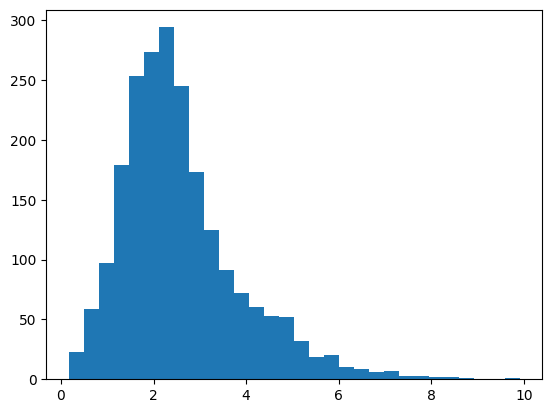

In [118]:
# how many units have signal to noise ratios that are greater than 3?
print(f'{session.units.shape[0]} units total')
units_with_very_high_snr = session.units[session.units['snr'] > 3]
print(f'{units_with_very_high_snr.shape[0]} units have snr > 3')
units_with_very_high_snr.structure_acronym.value_counts()

2164 units total
610 units have snr > 3


grey     415
VIS       81
VISrl     41
VISal     22
VISp      20
VISl      16
VISpm     15
Name: structure_acronym, dtype: int64

**Task**: Plot the location of the units on the probe (each probe with a individual plot). Color each structure a different color. What do you learn about the vertical position values?

Hint:

1. find out how many probes were used in this session
2. for each probe, plot the vertical position of the units, color by structure_acronym

769322716    495
769322718    483
769322712    478
769322722    313
769322714    303
769322720     92
Name: probe_id, dtype: int64

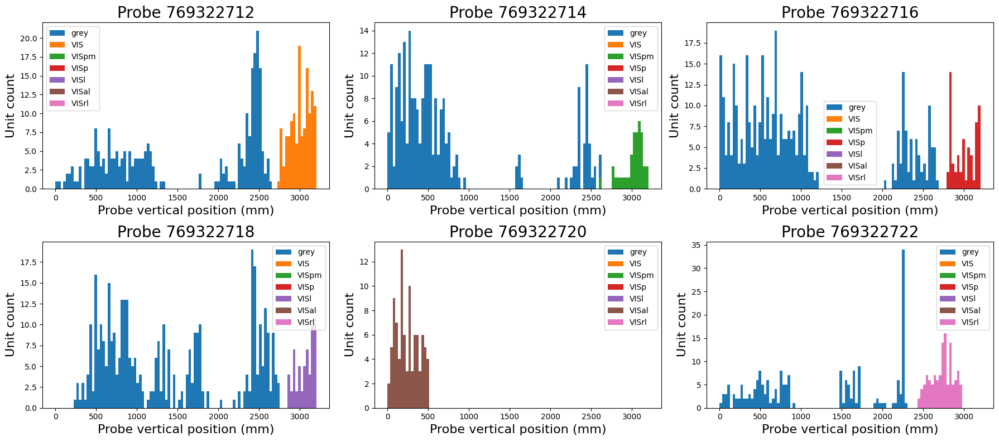

... as well as some more advanced (and very useful!) operations. For more information, please see the pandas documentation. The following topics might be particularly handy:

- [selecting data](http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html)
- [merging multiple dataframes](http://pandas.pydata.org/pandas-docs/stable/user_guide/merging.html)
- [grouping rows within a dataframe](http://pandas.pydata.org/pandas-docs/stable/user_guide/groupby.html)
- [pivot tables](http://pandas.pydata.org/pandas-docs/stable/user_guide/reshaping.html)

### Stimulus presentations

During the course of a session, visual stimuli are presented on a monitor to the subject. We call intervals of time where a specific stimulus is presented (and its parameters held constant!) a *stimulus presentation*.

You can find information about the stimulus presentations that were displayed during a session by accessing the `stimulus_presentations` attribute on your `EcephysSession` object. 

In [19]:
session.stimulus_presentations.head()

/home/fye/.conda/envs/dataprocessing/lib/python3.8/site-packages/hdmf/spec/namespace.py:535: UserWarning: Ignoring cached namespace 'hdmf-common' version 1.1.3 because version 1.8.0 is already loaded.
  warn("Ignoring cached namespace '%s' version %s because version %s is already loaded."
/home/fye/.conda/envs/dataprocessing/lib/python3.8/site-packages/hdmf/spec/namespace.py:535: UserWarning: Ignoring cached namespace 'core' version 2.2.2 because version 2.7.0 is already loaded.
  warn("Ignoring cached namespace '%s' version %s because version %s is already loaded."


,stimulus_block,start_time,stop_time,orientation,stimulus_name,color,size,x_position,spatial_frequency,y_position,temporal_frequency,contrast,phase,frame,duration,stimulus_condition_id
stimulus_presentation_id,,,,,,,,,,,,,,,,
0,null,24.686364,84.753134,null,spontaneous,null,null,null,null,null,null,null,null,null,60.066770,0
1,0.0,84.753134,84.986652,45.0,gabors,null,"[20.0, 20.0]",40.0,0.08,10.0,4.0,0.8,"[3644.93333333, 3644.93333333]",null,0.233518,1
2,0.0,84.986652,85.236850,0.0,gabors,null,"[20.0, 20.0]",40.0,0.08,-40.0,4.0,0.8,"[3644.93333333, 3644.93333333]",null,0.250198,2
3,0.0,85.236850,85.487048,90.0,gabors,null,"[20.0, 20.0]",-20.0,0.08,0.0,4.0,0.8,"[3644.93333333, 3644.93333333]",null,0.250198,3
4,0.0,85.487048,85.737246,0.0,gabors,null,"[20.0, 20.0]",30.0,0.08,-40.0,4.0,0.8,"[3644.93333333, 3644.93333333]",null,0.250198,4


Like the units table, this is a `pandas.DataFrame`. Each row corresponds to a stimulus presentation and lists the time (on the session's master clock, in seconds) when that presentation began and ended as well as the kind of stimulus that was presented (the "stimulus_name" column) and the parameter values that were used for that presentation. Many of these parameter values don't overlap between stimulus classes, so the stimulus_presentations table uses the string `"null"` to indicate an inapplicable parameter. The index is named "stimulus_presentation_id" and many methods on `EcephysSession` use these ids.

Some of the columns bear a bit of explanation:
- stimulus_block : A block consists of multiple presentations of the same stimulus class presented with (probably) different parameter values. If during a session stimuli were presented in the following order:
    - drifting gratings
    - static gratings
    - drifting gratings
    then the blocks for that session would be [0, 1, 2]. The gray period stimulus (just a blank gray screen) never gets a block.
- duration : this is just stop_time - start_time, precalculated for convenience.

What kinds of stimuli were presented during this session? Pandas makes it easy to find out:

In [20]:
session.stimulus_names # just the unique values from the 'stimulus_name' column

['spontaneous',
 'gabors',
 'flashes',
 'drifting_gratings',
 'natural_movie_three',
 'natural_movie_one',
 'static_gratings',
 'natural_scenes']

We can also obtain the `stimulus epochs` - blocks of time for which a particular kind of stimulus was presented - for this session.

In [21]:
session.get_stimulus_epochs()

,start_time,stop_time,duration,stimulus_name,stimulus_block
0,24.686364,84.753134,60.066770,spontaneous,null
1,84.753134,996.748081,911.994947,gabors,0.0
2,996.748081,1285.739454,288.991373,spontaneous,null
3,1285.739454,1584.255460,298.516006,flashes,1.0
4,1584.255460,1586.006904,1.751444,spontaneous,null
5,1586.006904,2185.507656,599.500752,drifting_gratings,2.0
6,2185.507656,2216.533564,31.025908,spontaneous,null
7,2216.533564,2817.035134,600.501570,natural_movie_three,3.0
8,2817.035134,2847.060224,30.025090,spontaneous,null
9,2847.060224,3147.311024,300.250800,natural_movie_one,4.0


If you are only interested in a subset of stimuli, you can either filter using pandas or using the `get_stimulus_table` convience method:

In [22]:
session.get_stimulus_table(['drifting_gratings']).head()

,stimulus_block,start_time,stop_time,orientation,stimulus_name,size,spatial_frequency,temporal_frequency,contrast,phase,duration,stimulus_condition_id
stimulus_presentation_id,,,,,,,,,,,,
3798,2.0,1586.006904,1588.008574,315.0,drifting_gratings,"[250.0, 250.0]",0.04,15.0,0.8,"[10617.96666667, 10617.96666667]",2.00167,246
3799,2.0,1589.009416,1591.011096,135.0,drifting_gratings,"[250.0, 250.0]",0.04,4.0,0.8,"[10617.96666667, 10617.96666667]",2.00168,247
3800,2.0,1592.011914,1594.013594,225.0,drifting_gratings,"[250.0, 250.0]",0.04,1.0,0.8,"[10617.96666667, 10617.96666667]",2.00168,248
3801,2.0,1595.014426,1597.016106,180.0,drifting_gratings,"[250.0, 250.0]",0.04,8.0,0.8,"[10617.96666667, 10617.96666667]",2.00168,249
3802,2.0,1598.016964,1600.018624,0.0,drifting_gratings,"[250.0, 250.0]",0.04,8.0,0.8,"[10617.96666667, 10617.96666667]",2.00166,250


In [23]:
# Let's see some example  of natural scences
session.get_stimulus_table(['natural_scenes']).head()

,stimulus_block,start_time,stop_time,stimulus_name,frame,duration,stimulus_condition_id
stimulus_presentation_id,,,,,,,
51355,9.0,5909.618224,5909.868445,natural_scenes,104.0,0.250221,4908
51356,9.0,5909.868445,5910.118665,natural_scenes,66.0,0.250221,4909
51357,9.0,5910.118665,5910.368886,natural_scenes,36.0,0.250221,4910
51358,9.0,5910.368886,5910.619106,natural_scenes,61.0,0.250221,4911
51359,9.0,5910.619106,5910.869306,natural_scenes,10.0,0.250199,4912


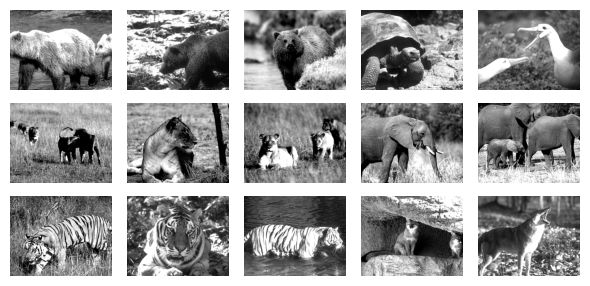

In [24]:
# here "frame" is the id of natural scence
n_cols = 5; n_rows = 3
fig, axs = plt.subplots(n_rows, n_cols, figsize=(n_cols*1.2, n_rows*1))
for img_id in range(n_cols*n_rows):
    img = cache.get_natural_scene_template(img_id)
    ax = axs[img_id//n_cols, img_id%n_cols]
    ax.imshow(img, cmap='gray')
    ax.axis('off')
plt.tight_layout()

In [25]:
# Let's see some example  of natural_movie_one
session.get_stimulus_table(['natural_movie_one']).head()

,stimulus_block,start_time,stop_time,orientation,stimulus_name,size,contrast,frame,duration,stimulus_condition_id
stimulus_presentation_id,,,,,,,,,,
22000,4.0,2847.060224,2847.093585,0.0,natural_movie_one,"[1920.0, 1080.0]",1.0,0.0,0.033361,3887
22001,4.0,2847.093585,2847.126945,0.0,natural_movie_one,"[1920.0, 1080.0]",1.0,1.0,0.033361,3888
22002,4.0,2847.126945,2847.160306,0.0,natural_movie_one,"[1920.0, 1080.0]",1.0,2.0,0.033361,3889
22003,4.0,2847.160306,2847.193667,0.0,natural_movie_one,"[1920.0, 1080.0]",1.0,3.0,0.033361,3890
22004,4.0,2847.193667,2847.227028,0.0,natural_movie_one,"[1920.0, 1080.0]",1.0,4.0,0.033361,3891


(-0.5, 607.5, 303.5, -0.5)

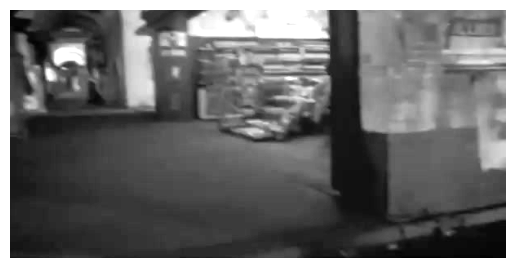

In [30]:
movie1 = cache.get_natural_movie_template(1)
# here the frame in stimulus table is relate to the index of frames in movie data array
plt.imshow(movie1[0], cmap='gray')
plt.axis('off')

In [31]:
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
from matplotlib.animation import FuncAnimation
from IPython.display import HTML

# resize the movie for display
frames, H, W = movie1.shape
movie_lr = movie1[:, ::8, ::8]
interval = session.get_stimulus_table(['natural_movie_one']).duration.mean()*1000

fig, ax = plt.subplots(figsize=(3,2))
im = ax.imshow(movie_lr[0], cmap='gray', vmin = 0, vmax = 255)
ax.axis('off')
fig.tight_layout()

# updating function
def update(frame):
    im.set_array(movie_lr[frame])
    return [im]

# create animation
ani = FuncAnimation(fig, update, frames=frames, interval=interval, blit=True)

plt.close(fig)  # prevent static display
HTML(ani.to_html5_video())

We might also want to know what the total set of available parameters is. The `get_stimulus_parameter_values` method provides a dictionary mapping stimulus parameters to the set of values that were applied to those parameters:

In [32]:
for key, values in session.get_stimulus_parameter_values().items():
    print(f'{key}: {values}')

orientation: [45.0 0.0 90.0 315.0 135.0 225.0 180.0 270.0 60.0 120.0 150.0 30.0]
color: [1.0 -1.0]
size: ['[20.0, 20.0]' '[300.0, 300.0]' '[250.0, 250.0]' '[1920.0, 1080.0]']
x_position: [40.0 -20.0 30.0 10.0 20.0 -10.0 0.0 -30.0 -40.0]
spatial_frequency: ['0.08' '[0.0, 0.0]' '0.04' 0.08 0.02 0.16 0.32 0.04]
y_position: [10.0 -40.0 0.0 30.0 -30.0 -10.0 -20.0 40.0 20.0]
temporal_frequency: [4.0 15.0 1.0 8.0 2.0]
contrast: [0.8 1.0]
phase: ['[3644.93333333, 3644.93333333]' '[0.0, 0.0]'
 '[10617.96666667, 10617.96666667]' '0.5' '0.0' '0.75' '0.25']
frame: [0.0 1.0 2.0 ... 3598.0 3599.0 -1.0]


Each distinct state of the monitor is called a "stimulus condition". Each presentation in the stimulus presentations table exemplifies such a condition. This is encoded in its stimulus_condition_id field.

To get the full list of conditions presented in a session, use the stimulus_conditions attribute:

In [34]:
session.stimulus_conditions.head()

,orientation,mask,stimulus_name,color,size,x_position,spatial_frequency,y_position,temporal_frequency,contrast,opacity,phase,frame,units,color_triplet
stimulus_condition_id,,,,,,,,,,,,,,,
0,null,null,spontaneous,null,null,null,null,null,null,null,null,null,null,null,null
1,45.0,circle,gabors,null,"[20.0, 20.0]",40.0,0.08,10.0,4.0,0.8,True,"[3644.93333333, 3644.93333333]",null,deg,"[1.0, 1.0, 1.0]"
2,0.0,circle,gabors,null,"[20.0, 20.0]",40.0,0.08,-40.0,4.0,0.8,True,"[3644.93333333, 3644.93333333]",null,deg,"[1.0, 1.0, 1.0]"
3,90.0,circle,gabors,null,"[20.0, 20.0]",-20.0,0.08,0.0,4.0,0.8,True,"[3644.93333333, 3644.93333333]",null,deg,"[1.0, 1.0, 1.0]"
4,0.0,circle,gabors,null,"[20.0, 20.0]",30.0,0.08,-40.0,4.0,0.8,True,"[3644.93333333, 3644.93333333]",null,deg,"[1.0, 1.0, 1.0]"


### Spike data

The `EcephysSession` object holds spike times (in seconds on the session master clock) for each unit. These are stored in a dictionary, which maps unit ids (the index values of the units table) to arrays of spike times.

In [35]:
# grab an arbitrary (though high-snr!) unit (we made units_with_high_snr above)
high_snr_unit_ids = units_with_very_high_snr.index.values
unit_id = high_snr_unit_ids[0]

print(f"{len(session.spike_times[unit_id])} spikes were detected for unit {unit_id} at times:")
session.spike_times[unit_id]

13720 spikes were detected for unit 950920977 at times:


array([4.70326541e+00, 4.77196548e+00, 4.79529884e+00, ...,
       9.64917472e+03, 9.64920992e+03, 9.64942095e+03])

In [36]:
# get spike times from the first block of drifting gratings presentations 
drifting_gratings_presentation_ids = session.stimulus_presentations.loc[
    (session.stimulus_presentations['stimulus_name'] == 'drifting_gratings')
].index.values

times = session.presentationwise_spike_times(
    stimulus_presentation_ids=drifting_gratings_presentation_ids,
    unit_ids=high_snr_unit_ids
)

times.head()

,stimulus_presentation_id,unit_id,time_since_stimulus_presentation_onset
spike_time,,,
1586.007289,3798,950956067,0.000385
1586.008799,3798,950922303,0.001895
1586.008832,3798,950923620,0.001928
1586.009155,3798,950951434,0.002251
1586.009562,3798,950933149,0.002658


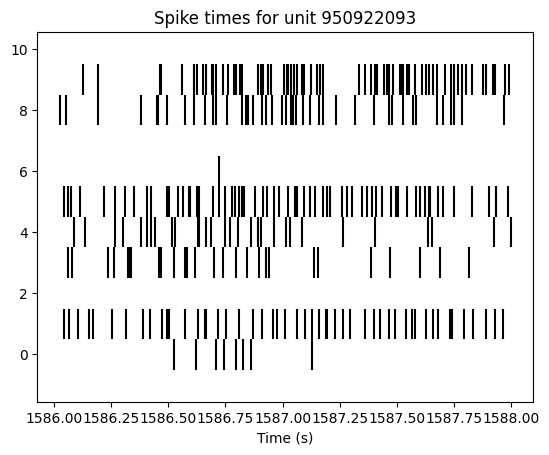

In [60]:
spikes = []
for unit_id in high_snr_unit_ids[0:10]:
    time_idx = np.where((session.spike_times[unit_id] < 1588) & (session.spike_times[unit_id] > 1586))[0]
    spikes.append(session.spike_times[unit_id][time_idx])
plt.eventplot(spikes, colors='black')
plt.xlabel('Time (s)')
plt.title(f'Spike times for unit {unit_id}')
plt.show()

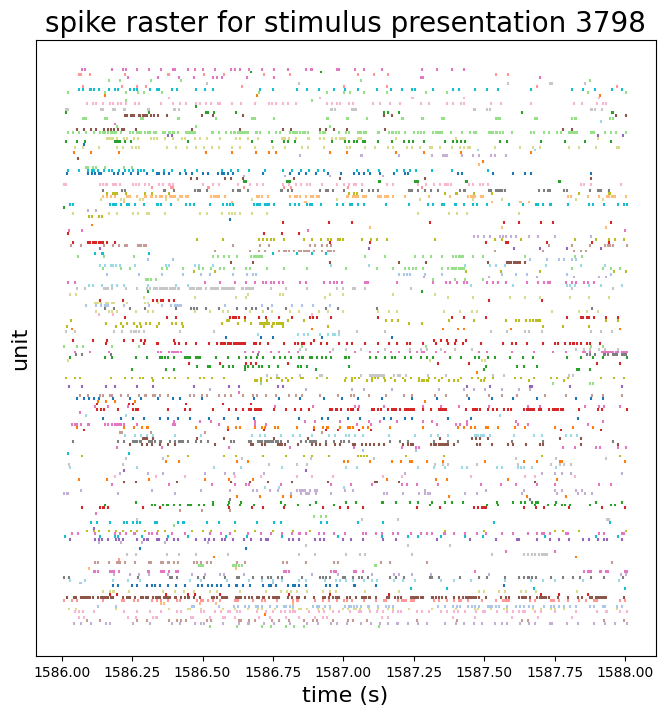

stimulus_block                                        2.0
start_time                                    1586.006904
stop_time                                     1588.008574
orientation                                         315.0
stimulus_name                           drifting_gratings
color                                                null
size                                       [250.0, 250.0]
x_position                                           null
spatial_frequency                                    0.04
y_position                                           null
temporal_frequency                                   15.0
contrast                                              0.8
phase                    [10617.96666667, 10617.96666667]
frame                                                null
duration                                          2.00167
stimulus_condition_id                                 246
Name: 3798, dtype: object

In [37]:
from allensdk.brain_observatory.ecephys.visualization import raster_plot
first_drifting_grating_presentation_id = times['stimulus_presentation_id'].values[0]
plot_times = times[times['stimulus_presentation_id'] == first_drifting_grating_presentation_id]

fig = raster_plot(plot_times, title=f'spike raster for stimulus presentation {first_drifting_grating_presentation_id}')
plt.show()

# also print out this presentation
session.stimulus_presentations.loc[first_drifting_grating_presentation_id]

In [38]:
stats = session.conditionwise_spike_statistics(
    stimulus_presentation_ids=drifting_gratings_presentation_ids,
    unit_ids=high_snr_unit_ids
)

# display the parameters associated with each condition
stats = pd.merge(stats, session.stimulus_conditions, left_on="stimulus_condition_id", right_index=True)

stats.head()

,,spike_count,stimulus_presentation_count,spike_mean,spike_std,spike_sem,orientation,mask,stimulus_name,color,size,x_position,spatial_frequency,y_position,temporal_frequency,contrast,opacity,phase,frame,units,color_triplet
unit_id,stimulus_condition_id,,,,,,,,,,,,,,,,,,,,
950920977,246,118,15,7.866667,10.384512,2.681270,315.0,None,drifting_gratings,null,"[250.0, 250.0]",null,0.04,null,15.0,0.8,True,"[10617.96666667, 10617.96666667]",null,deg,"[1.0, 1.0, 1.0]"
950921087,246,931,15,62.066667,8.039782,2.075863,315.0,None,drifting_gratings,null,"[250.0, 250.0]",null,0.04,null,15.0,0.8,True,"[10617.96666667, 10617.96666667]",null,deg,"[1.0, 1.0, 1.0]"
950921191,246,0,15,0.000000,0.000000,0.000000,315.0,None,drifting_gratings,null,"[250.0, 250.0]",null,0.04,null,15.0,0.8,True,"[10617.96666667, 10617.96666667]",null,deg,"[1.0, 1.0, 1.0]"
950921355,246,244,15,16.266667,7.205818,1.860534,315.0,None,drifting_gratings,null,"[250.0, 250.0]",null,0.04,null,15.0,0.8,True,"[10617.96666667, 10617.96666667]",null,deg,"[1.0, 1.0, 1.0]"
950921380,246,188,15,12.533333,5.501515,1.420485,315.0,None,drifting_gratings,null,"[250.0, 250.0]",null,0.04,null,15.0,0.8,True,"[10617.96666667, 10617.96666667]",null,deg,"[1.0, 1.0, 1.0]"


**Task**: Plot the firing rate for high_snr_unit_ids[0] across the entire session

Hint: A raster plot won't work for visualizing the activity across the entire session as there are too many spikes! Instead, bin the activity in 1 second bins. 

Text(0, 0.5, 'FR (Hz)')

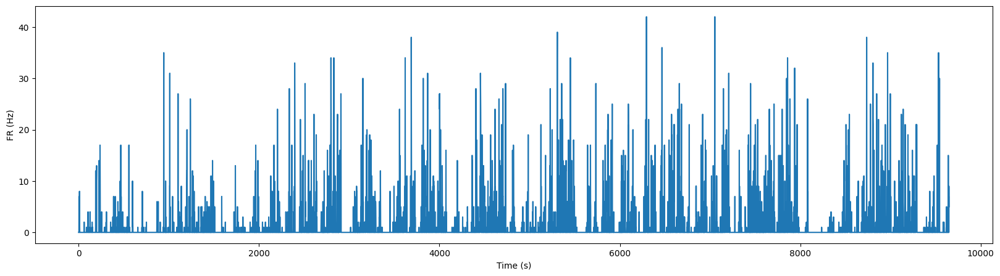

**Task**: Now let's do this for up to 50 units in V1. Make an array of the binned activity of all units in V1 called 'v1_binned'. We'll use this again later.

Also, since you have got the stimulus start time and end time for each epoch, you can also visualize when different stimulus were presented during the session. Have a try!

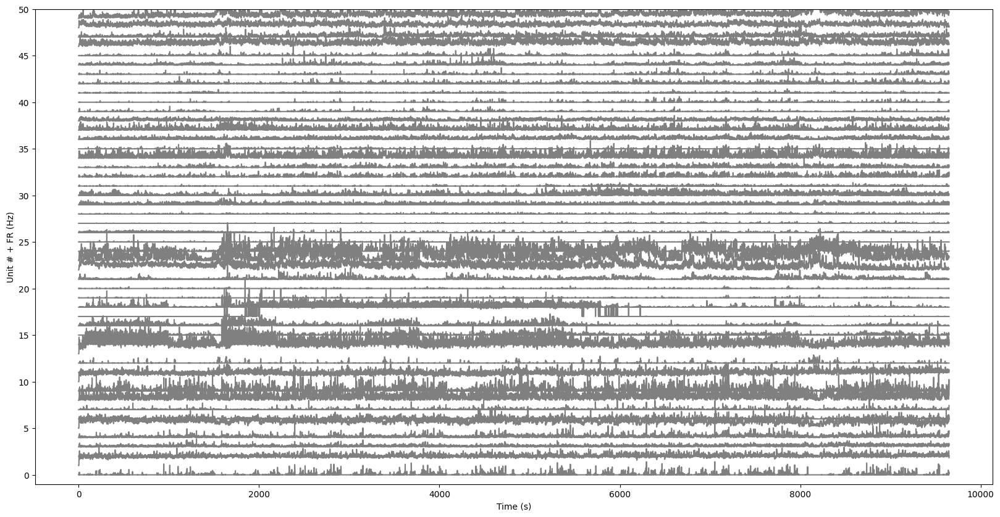

In [ ]:
numunits = 50
binned_spikes = np.empty((numunits, numbins))
for i in range(numunits):
    spikes = session.spike_times[high_snr_unit_ids[i]]
    binned_spikes[i] = np.histogram(spikes, bins=numbins, range=(0, numbins))[0]
plt.figure(figsize=(20,10))
for i in range(numunits):
    plt.plot(i+(binned_spikes[i,:]/30.), color='gray')

# colors = ['blue','orange','green','red','yellow','purple','magenta','gray','lightblue']
# stimulus_epochs = ...
# for c, stim_name in enumerate(session.stimulus_names):
#     stim = ...
#     for j in range(len(stim)):
#         plt.axvspan(xmin=..., xmax=..., color=colors[c], alpha=0.1)

plt.xlabel("Time (s)")
plt.ylabel("Unit # + FR (Hz)")
plt.yticks(np.arange(numunits)*5, np.arange(numunits)*5)
plt.ylim([-1, numunits])
plt.show()

**Task**:

Mark the times when this particular scene was presented on our plot of the activity (without the epochs and running speed).

In [140]:
stim_table_ns = session.get_stimulus_table('natural_scenes')

In [141]:
stim_table_ns

,stimulus_block,start_time,stop_time,stimulus_name,frame,duration,stimulus_condition_id
stimulus_presentation_id,,,,,,,
51355,9.0,5909.618224,5909.868445,natural_scenes,104.0,0.250221,4908
51356,9.0,5909.868445,5910.118665,natural_scenes,66.0,0.250221,4909
51357,9.0,5910.118665,5910.368886,natural_scenes,36.0,0.250221,4910
51358,9.0,5910.368886,5910.619106,natural_scenes,61.0,0.250221,4911
51359,9.0,5910.619106,5910.869306,natural_scenes,10.0,0.250199,4912
...,...,...,...,...,...,...,...
68224,13.0,8568.088830,8568.339045,natural_scenes,35.0,0.250216,4989
68225,13.0,8568.339045,8568.589261,natural_scenes,41.0,0.250216,4958
68226,13.0,8568.589261,8568.839476,natural_scenes,111.0,0.250216,4985


(5000.0, 9000.0)

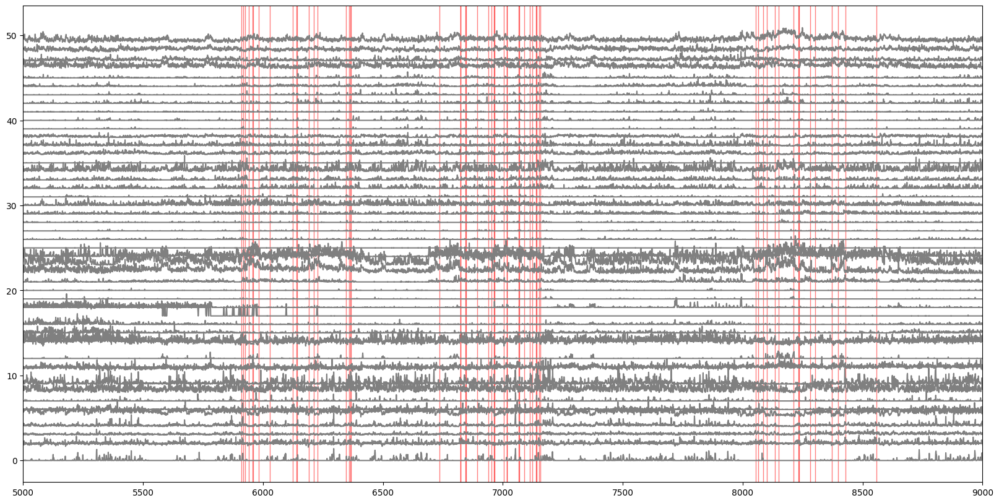

In [ ]:
plt.figure(figsize=(20,10))
for i in range(numunits):
    plt.plot(i+(binned_spikes[i,:]/30.), color='gray')

# take the first frame as an example
stim_subset = stim_table_ns[stim_table_ns.frame==stim_table_ns.frame.iloc[0]]
for j in range(len(stim_subset)):
    plt.axvspan(xmin=..., xmax=..., color='r', alpha=0.5)
plt.xlim(5000,9000)

### Spike histograms

It is commonly useful to compare spike data from across units and stimulus presentations, all relative to the onset of a stimulus presentation. We can do this using the `presentationwise_spike_counts` method. 

In [106]:
# We're going to build an array of spike counts surrounding stimulus presentation onset
# To do that, we will need to specify some bins (in seconds, relative to stimulus onset)
time_bin_edges = np.linspace(-0.01, 0.4, 200)

# look at responses to the flash stimulus
flash_250_ms_stimulus_presentation_ids = session.stimulus_presentations[
    session.stimulus_presentations['stimulus_name'] == 'flashes'
].index.values

# and get a set of units with only decent snr
decent_snr_unit_ids = session.units[
    session.units['snr'] >= 4
].index.values

spike_counts_da = session.presentationwise_spike_counts(
    bin_edges=time_bin_edges,
    stimulus_presentation_ids=flash_250_ms_stimulus_presentation_ids,
    unit_ids=decent_snr_unit_ids
)
spike_counts_da

<xarray.DataArray 'spike_counts' (stimulus_presentation_id: 150,
                                  time_relative_to_stimulus_onset: 199,
                                  unit_id: 291)>
array([[[0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        ...,
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0]],

       [[0, 0, 0, ..., 0, 0, 0],
        [0, 1, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        ...,
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0]],

       [[0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        ...,
...
        ...,
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0]],

       [[0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        ...,
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0]],

       [[0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        ...,
        [0, 1, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0]]], dtype=uint16)
Coordinates:
  * stimulus_presentation_id         (stimulus_presentation_id) int64 3647 .....
  * time_relative_to_stimulus_onset  (time_relative_to_stimulus_onset) float64 ...
  * unit_id                          (unit_id) int64 950920977 ... 950966371

This has returned a new (to this notebook) data structure, the `xarray.DataArray`. You can think of this as similar to a 3+D `pandas.DataFrame`, or as a `numpy.ndarray` with labeled axes and indices. See the [xarray documentation](http://xarray.pydata.org/en/stable/index.html) for more information. In the mean time, the salient features are:

- Dimensions : Each axis on each data variable is associated with a named dimension. This lets us see unambiguously what the axes of our array mean.
- Coordinates : Arrays of labels for each sample on each dimension.

xarray is nice because it forces code to be explicit about dimensions and coordinates, improving readability and avoiding bugs. However, you can always convert to numpy or pandas data structures as follows:
- to pandas: `spike_counts_ds.to_dataframe()` produces a multiindexed dataframe
- to numpy: `spike_counts_ds.values` gives you access to the underlying numpy array

We can now plot spike counts for a particular presentation:

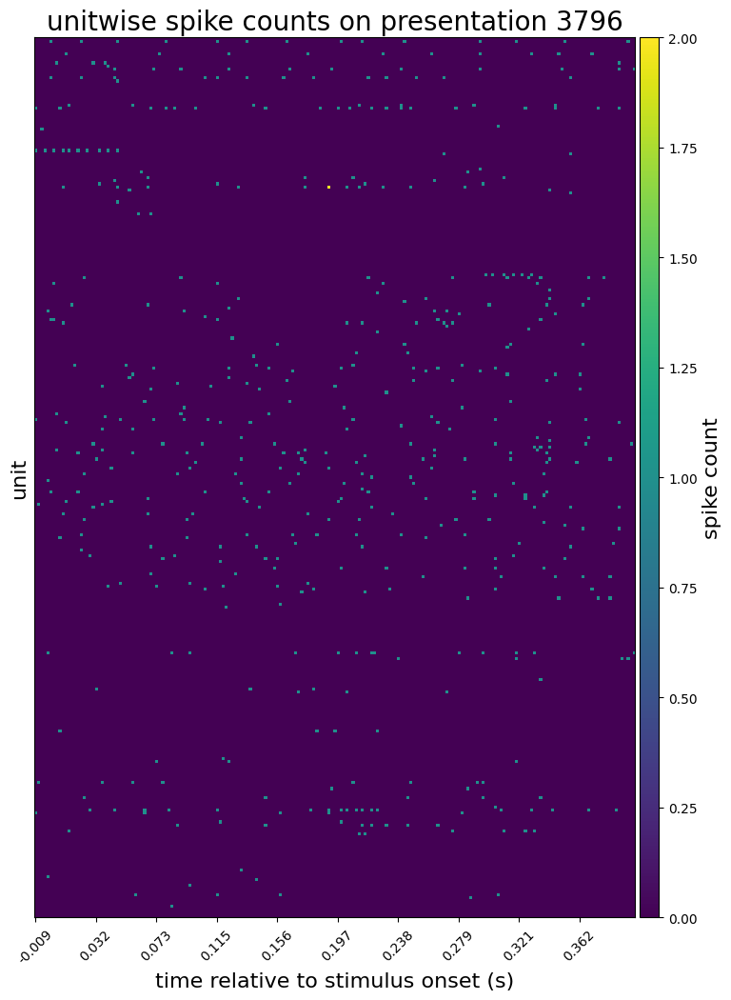

In [107]:
from allensdk.brain_observatory.ecephys.visualization import plot_spike_counts
presentation_id = 3796 # chosen arbitrarily
plot_spike_counts(
    spike_counts_da.loc[{'stimulus_presentation_id': presentation_id}], 
    spike_counts_da['time_relative_to_stimulus_onset'],
    'spike count', 
    f'unitwise spike counts on presentation {presentation_id}'
)
plt.show()

We can also average across all presentations, adding a new data array to the dataset. Notice that this one no longer has a stimulus_presentation_id dimension, as we have collapsed it by averaging.

In [108]:
mean_spike_counts = spike_counts_da.mean(dim='stimulus_presentation_id')
mean_spike_counts

<xarray.DataArray 'spike_counts' (time_relative_to_stimulus_onset: 199,
                                  unit_id: 291)>
array([[0.        , 0.07333333, 0.        , ..., 0.00666667, 0.        ,
        0.00666667],
       [0.        , 0.04666667, 0.        , ..., 0.        , 0.        ,
        0.        ],
       [0.        , 0.07333333, 0.        , ..., 0.00666667, 0.        ,
        0.00666667],
       ...,
       [0.        , 0.06      , 0.        , ..., 0.00666667, 0.        ,
        0.        ],
       [0.        , 0.05333333, 0.        , ..., 0.        , 0.        ,
        0.        ],
       [0.        , 0.05333333, 0.        , ..., 0.        , 0.        ,
        0.        ]])
Coordinates:
  * time_relative_to_stimulus_onset  (time_relative_to_stimulus_onset) float64 ...
  * unit_id                          (unit_id) int64 950920977 ... 950966371

... and plot the mean spike counts

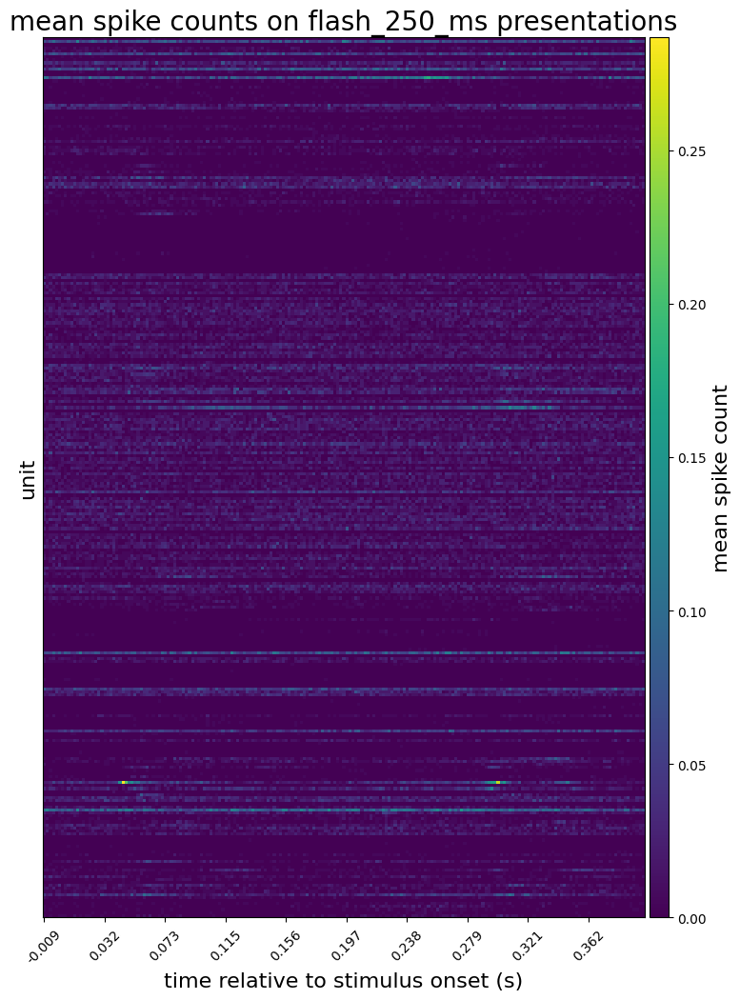

In [109]:
plot_spike_counts(
    mean_spike_counts, 
    mean_spike_counts['time_relative_to_stimulus_onset'],
    'mean spike count', 
    'mean spike counts on flash_250_ms presentations'
)
plt.show()

### Waveforms

We store precomputed mean waveforms for each unit in the `mean_waveforms` attribute on the `EcephysSession` object. This is a dictionary which maps unit ids to xarray [DataArrays](http://xarray.pydata.org/en/stable/generated/xarray.DataArray.html). These have `channel` and `time` (seconds, aligned to the detected event times) dimensions. The data values are in microvolts, as measured at the recording site.

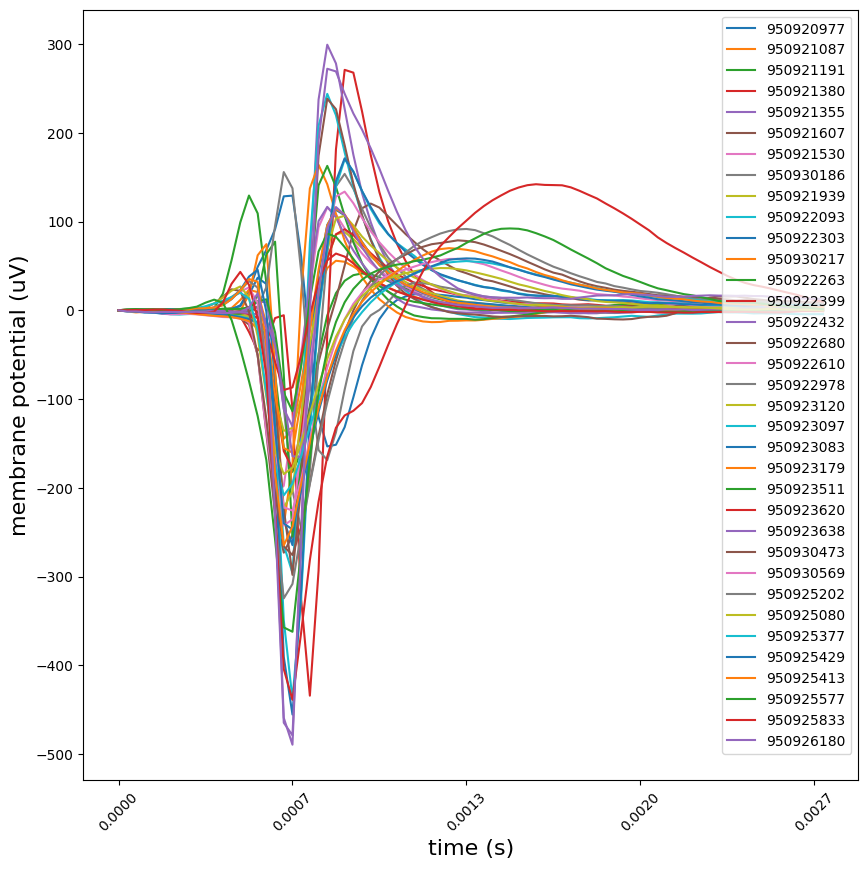

In [74]:
from allensdk.brain_observatory.ecephys.visualization import plot_mean_waveforms
units_of_interest = high_snr_unit_ids[:35]

waveforms = {uid: session.mean_waveforms[uid] for uid in units_of_interest}
peak_channels = {uid: session.units.loc[uid, 'peak_channel_id'] for uid in units_of_interest}

# plot the mean waveform on each unit's peak channel/
plot_mean_waveforms(waveforms, units_of_interest, peak_channels)
plt.show()

Since neuropixels probes are densely populated with channels, spikes are typically detected on several channels. We can see this by plotting mean waveforms on channels surrounding a unit's peak channel:

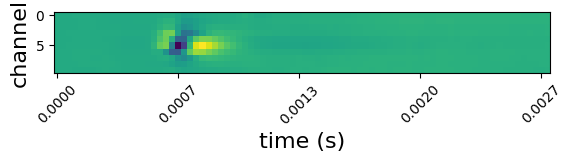

In [ ]:
uid = units_of_interest[12]
unit_waveforms = waveforms[uid]
peak_channel = peak_channels[uid]
peak_channel_idx = np.where(unit_waveforms["channel_id"] == peak_channel)[0][0]

ch_min = max(peak_channel_idx - 10, 0)
ch_max = min(peak_channel_idx + 10, len(unit_waveforms["channel_id"]) - 1)
surrounding_channels = unit_waveforms["channel_id"][np.arange(ch_min, ch_max, 2)]

fig, ax = plt.subplots()
ax.imshow(unit_waveforms.loc[{"channel_id": surrounding_channels}])

ax.set_ylabel("channel", fontsize=16)

ax.set_xticks(np.arange(0, len(unit_waveforms['time']), 20))
ax.set_xticklabels([f'{float(ii):1.4f}' for ii in unit_waveforms['time'][::20]], rotation=45)
ax.set_xlabel("time (s)", fontsize=16)

plt.show()

### Running speed

We can obtain the velocity at which the experimental subject ran as a function of time by accessing the `running_speed` attribute. This returns a pandas dataframe whose rows are intervals of time (defined by "start_time" and "end_time" columns), and whose "velocity" column contains mean running speeds within those intervals.

Here we'll plot the running speed trace for an arbitrary chunk of time.

In [136]:
session.running_speed

,start_time,end_time,velocity
0,24.63459,24.65021,-0.636992
1,24.66653,24.68321,0.645780
2,24.68321,24.70007,-2.358218
3,24.71668,24.73321,0.806473
4,24.73321,24.75028,-0.421951
...,...,...,...
366296,9212.19111,9212.20875,1.411839
366297,9212.22796,9212.24148,-2.867140
366298,9212.24148,9212.25758,0.238695
366299,9212.27409,9212.29080,1.901974


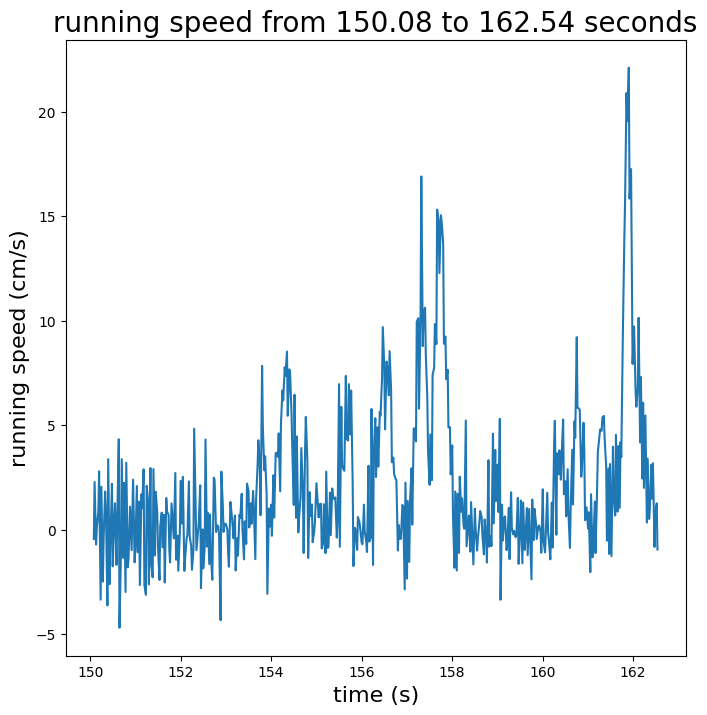

In [135]:
from allensdk.brain_observatory.visualization import plot_running_speed
running_speed_midpoints = session.running_speed["start_time"] + \
    (session.running_speed["end_time"] - session.running_speed["start_time"]) / 2
plot_running_speed(
    running_speed_midpoints, 
    session.running_speed["velocity"], 
    start_index=5000,
    stop_index=5500
)
plt.show()

Task: 

1. Get the `running_speed` and its time stamps from the session object. Plot the speed as a function of time.

2. plot the running speed with the binned activity of units you got from previous task.

Text(0, 0.5, 'Running speed (cm/s)')

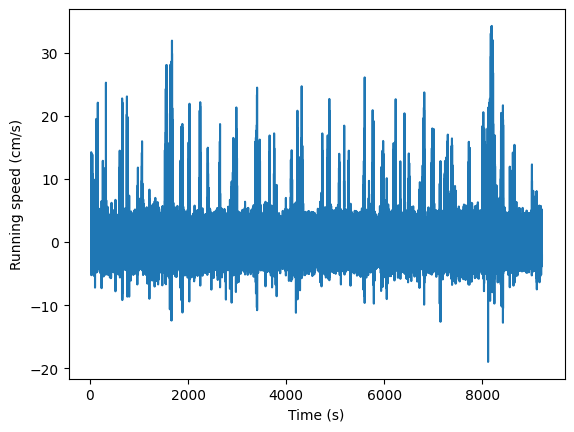

(-10.0, 52.0)

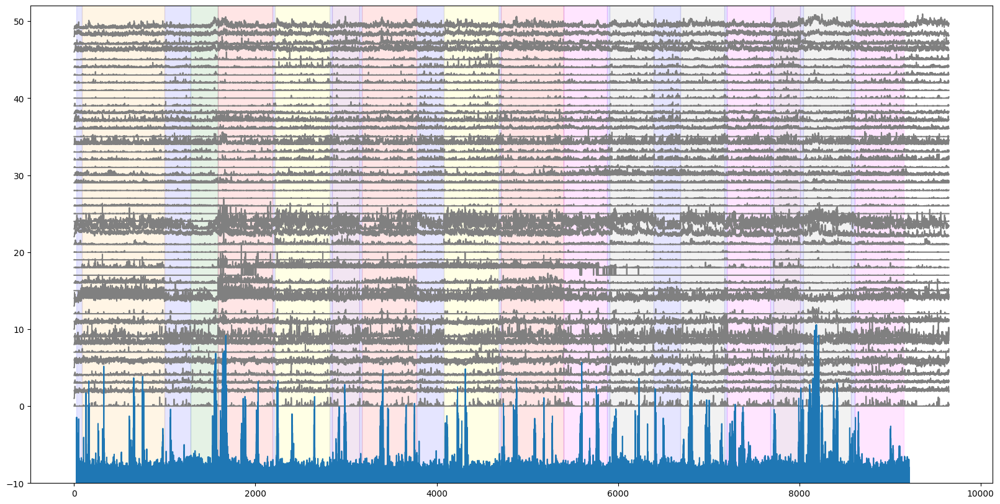

In [ ]:
plt.figure(figsize=(20,10))
for i in range(numunits):
    plt.plot(i+(binned_spikes[i,:]/30.), color='gray')

#scale the running speed and offset it on the plot
# plot running speed

colors = ['blue','orange','green','red','yellow','purple','magenta','gray','lightblue']
for c, stim_name in enumerate(session.stimulus_names):
    stim = stimulus_epochs[stimulus_epochs.stimulus_name==stim_name]
    for j in range(len(stim)):
        plt.axvspan(xmin=stim["start_time"].iloc[j], xmax=stim["stop_time"].iloc[j], color=colors[c], alpha=0.1)

plt.ylim(-10,52)

### Optogenetic stimulation

In [110]:
session.optogenetic_stimulation_epochs

,start_time,condition,level,stop_time,stimulus_name,duration
id,,,,,,
0,9225.19538,a single square pulse,2.5,9225.20038,pulse,0.005
1,9227.05495,a single square pulse,1.0,9227.05995,pulse,0.005
2,9228.82508,half-period of a cosine wave,2.5,9229.82508,raised_cosine,1.000
3,9230.66016,2.5 ms pulses at 10 Hz,2.5,9231.66016,fast_pulses,1.000
4,9232.47321,a single square pulse,2.5,9232.47821,pulse,0.005
...,...,...,...,...,...,...
175,9558.69719,a single square pulse,2.5,9558.70719,pulse,0.010
176,9560.83998,2.5 ms pulses at 10 Hz,1.0,9561.83998,fast_pulses,1.000
177,9562.93319,half-period of a cosine wave,1.0,9563.93319,raised_cosine,1.000


### Eye tracking ellipse fits and estimated screen gaze location

Ecephys sessions may contain eye tracking data in the form of ellipse fits and estimated screen gaze location. Let's look at the ellipse fits first:

In [82]:
pupil_data = session.get_pupil_data()
pupil_data

,corneal_reflection_center_x,corneal_reflection_center_y,corneal_reflection_height,corneal_reflection_width,corneal_reflection_phi,pupil_center_x,pupil_center_y,pupil_height,pupil_width,pupil_phi,eye_center_x,eye_center_y,eye_height,eye_width,eye_phi
Time (s),,,,,,,,,,,,,,,
3.15554,327.339200,220.528876,14.244923,17.081637,-0.046604,327.890593,192.698878,77.872105,84.083958,-0.301362,310.748365,207.967287,249.203873,316.157601,0.080571
3.17849,327.225841,220.183568,14.572399,16.327728,-0.186530,NaN,NaN,NaN,NaN,NaN,311.049063,208.004817,248.794925,315.590852,0.078970
3.18553,327.171088,220.285960,14.580478,16.148193,-0.267194,NaN,NaN,NaN,NaN,NaN,311.266888,208.144224,249.219290,315.940990,0.089244
3.21892,327.097132,220.502671,14.479239,16.052614,-0.006504,329.518794,194.347578,82.613225,90.869138,0.356213,311.164458,208.152664,248.900727,315.556128,0.091454
3.25211,327.280871,220.744562,14.348683,15.772792,-0.169704,328.559736,195.767417,85.748791,89.002149,0.547860,311.485722,208.469494,249.189809,315.082340,0.098329
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9620.35475,329.367535,221.074521,14.933124,16.192540,0.187886,336.670551,194.516703,114.665041,113.836560,0.043435,309.681293,209.447351,275.474634,339.468366,0.055758
9620.38810,329.158337,220.718761,14.828980,15.722836,-0.268752,336.392678,194.467830,114.075867,115.859246,0.626611,309.616557,209.426619,276.002179,339.240306,0.055885
9620.42135,328.598378,220.475758,14.775809,14.923776,0.011216,336.569734,194.084995,111.834563,116.596892,0.142837,309.978675,209.502927,275.809440,338.650155,0.057104


This particular session has eye tracking data, let's try plotting the ellipse fits over time.

In [83]:
%%capture
from matplotlib import animation
from matplotlib.patches import Ellipse

def plot_animated_ellipse_fits(pupil_data: pd.DataFrame, start_frame: int, end_frame: int):

    start_frame = 0 if (start_frame < 0) else start_frame
    end_frame = len(pupil_data) if (end_frame > len(pupil_data)) else end_frame
    
    frame_times = pupil_data.index.values[start_frame:end_frame]
    interval = np.average(np.diff(frame_times)) * 1000

    fig = plt.figure()
    ax = plt.axes(xlim=(0, 480), ylim=(0, 480))

    cr_ellipse = Ellipse((0, 0), width=0.0, height=0.0, angle=0, color='white')
    pupil_ellipse = Ellipse((0, 0), width=0.0, height=0.0, angle=0, color='black')
    eye_ellipse = Ellipse((0, 0), width=0.0, height=0.0, angle=0, color='grey')

    ax.add_patch(eye_ellipse)
    ax.add_patch(pupil_ellipse)
    ax.add_patch(cr_ellipse)

    def update_ellipse(ellipse_patch, ellipse_frame_vals: pd.DataFrame, prefix: str):
        ellipse_patch.center = tuple(ellipse_frame_vals[[f"{prefix}_center_x", f"{prefix}_center_y"]].values)
        ellipse_patch.width = ellipse_frame_vals[f"{prefix}_width"]
        ellipse_patch.height = ellipse_frame_vals[f"{prefix}_height"]
        ellipse_patch.angle = np.degrees(ellipse_frame_vals[f"{prefix}_phi"])
    
    def init():
        return [cr_ellipse, pupil_ellipse, eye_ellipse]

    def animate(i):
        ellipse_frame_vals = pupil_data.iloc[i]
        
        update_ellipse(cr_ellipse, ellipse_frame_vals, prefix="corneal_reflection")
        update_ellipse(pupil_ellipse, ellipse_frame_vals, prefix="pupil")
        update_ellipse(eye_ellipse, ellipse_frame_vals, prefix="eye")
        
        return [cr_ellipse, pupil_ellipse, eye_ellipse]
    
    return animation.FuncAnimation(fig, animate, init_func=init, interval=interval, frames=range(start_frame, end_frame), blit=True)

anim = plot_animated_ellipse_fits(pupil_data, 100, 600)

In [84]:
from IPython.display import HTML

HTML(anim.to_jshtml())

Using the above ellipse fits and location/orientation information about the experimental rigs, it is possible to calculate additional statistics such as pupil size or estimate a gaze location on screen at a given time. Due to the degrees of freedom in some rig components, gaze estimates have no accuracy guarantee. For additional information about the gaze mapping estimation process please refer to: https://github.com/AllenInstitute/AllenSDK/tree/master/allensdk/brain_observatory/gaze_mapping

In [85]:
gaze_data = session.get_screen_gaze_data()
gaze_data

,raw_eye_area,raw_pupil_area,raw_screen_coordinates_x_cm,raw_screen_coordinates_y_cm,raw_screen_coordinates_spherical_x_deg,raw_screen_coordinates_spherical_y_deg
Time (s),,,,,,
3.15554,0.064380,0.005777,3.387484,-1.992761,12.619837,-7.568313
3.17849,NaN,NaN,NaN,NaN,NaN,NaN
3.18553,NaN,NaN,NaN,NaN,NaN,NaN
3.21892,0.064179,0.006747,3.237351,-2.175026,12.057906,-8.251397
3.25211,0.064157,0.006473,3.114664,-2.067825,11.624795,-7.849905
...,...,...,...,...,...,...
9620.35475,0.076414,0.010744,3.313857,-2.646535,12.275483,-10.007139
9620.38810,0.076509,0.010969,3.283187,-2.640185,12.166127,-9.983610
9620.42135,0.076322,0.011109,3.302778,-2.711949,12.226724,-10.249300


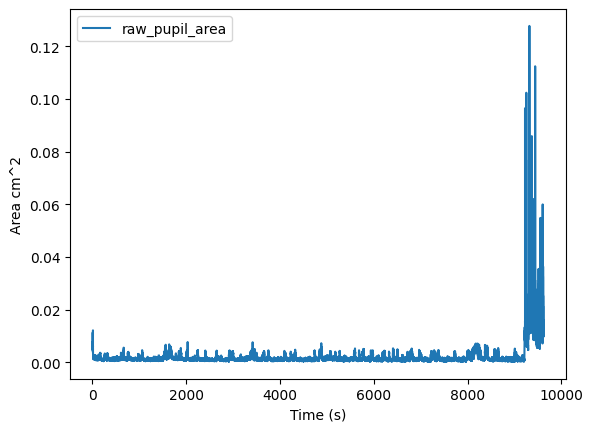

In [86]:
ax = gaze_data[["raw_pupil_area"]].plot()
_ = ax.set_ylabel("Area cm^2")

### Receptive Field

In [87]:
from allensdk.brain_observatory.ecephys.stimulus_analysis.receptive_field_mapping import ReceptiveFieldMapping

rf_mapping = ReceptiveFieldMapping(session)
rf_mapping.stim_table.head()

,stimulus_block,start_time,stop_time,orientation,stimulus_name,size,x_position,spatial_frequency,y_position,temporal_frequency,contrast,phase,duration,stimulus_condition_id
stimulus_presentation_id,,,,,,,,,,,,,,
1,0.0,84.753134,84.986652,45.0,gabors,"[20.0, 20.0]",40.0,0.08,10.0,4.0,0.8,"[3644.93333333, 3644.93333333]",0.233518,1
2,0.0,84.986652,85.236850,0.0,gabors,"[20.0, 20.0]",40.0,0.08,-40.0,4.0,0.8,"[3644.93333333, 3644.93333333]",0.250198,2
3,0.0,85.236850,85.487048,90.0,gabors,"[20.0, 20.0]",-20.0,0.08,0.0,4.0,0.8,"[3644.93333333, 3644.93333333]",0.250198,3
4,0.0,85.487048,85.737246,0.0,gabors,"[20.0, 20.0]",30.0,0.08,-40.0,4.0,0.8,"[3644.93333333, 3644.93333333]",0.250198,4
5,0.0,85.737246,85.987463,45.0,gabors,"[20.0, 20.0]",10.0,0.08,30.0,4.0,0.8,"[3644.93333333, 3644.93333333]",0.250217,5


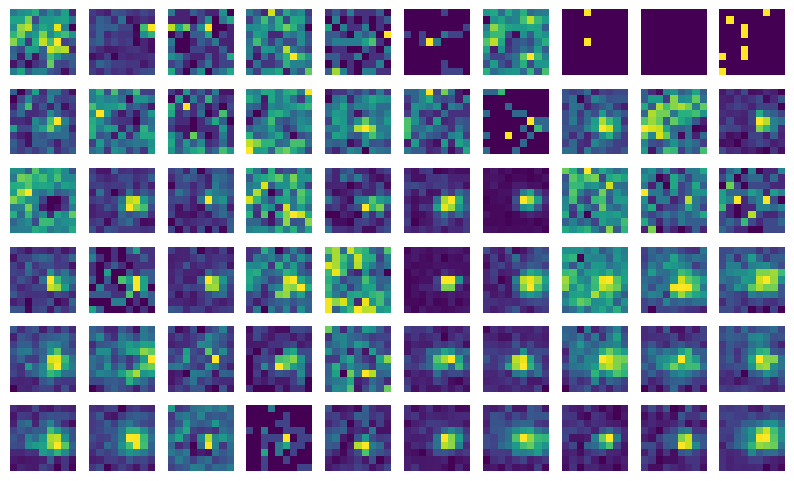

In [100]:
def plot_rf(unit_id, index):
    RF = rf_mapping.get_receptive_field(unit_id)
    _ = plt.subplot(6,10, index+1)
    _ = plt.imshow(RF)
    _ = plt.axis('off')

_ = plt.figure(figsize=(10,6))
v1_units = session.units[session.units.ecephys_structure_acronym == 'VISp']
_ = [plot_rf(RF, index) for index, RF in enumerate(v1_units.index.values[:60])]

### Tuning Curve


In [147]:
stim_table = session.get_stimulus_table()
stim_table.head()

,stimulus_block,start_time,stop_time,orientation,stimulus_name,color,size,x_position,spatial_frequency,y_position,temporal_frequency,contrast,phase,frame,duration,stimulus_condition_id
stimulus_presentation_id,,,,,,,,,,,,,,,,
0,null,24.686364,84.753134,null,spontaneous,null,null,null,null,null,null,null,null,null,60.066770,0
1,0.0,84.753134,84.986652,45.0,gabors,null,"[20.0, 20.0]",40.0,0.08,10.0,4.0,0.8,"[3644.93333333, 3644.93333333]",null,0.233518,1
2,0.0,84.986652,85.236850,0.0,gabors,null,"[20.0, 20.0]",40.0,0.08,-40.0,4.0,0.8,"[3644.93333333, 3644.93333333]",null,0.250198,2
3,0.0,85.236850,85.487048,90.0,gabors,null,"[20.0, 20.0]",-20.0,0.08,0.0,4.0,0.8,"[3644.93333333, 3644.93333333]",null,0.250198,3
4,0.0,85.487048,85.737246,0.0,gabors,null,"[20.0, 20.0]",30.0,0.08,-40.0,4.0,0.8,"[3644.93333333, 3644.93333333]",null,0.250198,4


In [157]:
dg_stats = session.conditionwise_spike_statistics(
    stimulus_presentation_ids=session.stimulus_presentations[
        session.stimulus_presentations['stimulus_name'] == 'drifting_gratings'
    ].index.values,
    unit_ids=high_snr_unit_ids
)
dg_stats.head()

,,spike_count,stimulus_presentation_count,spike_mean,spike_std,spike_sem
unit_id,stimulus_condition_id,,,,,
950920977,246,118,15,7.866667,10.384512,2.681270
950921087,246,931,15,62.066667,8.039782,2.075863
950921191,246,0,15,0.000000,0.000000,0.000000
950921355,246,244,15,16.266667,7.205818,1.860534
950921380,246,188,15,12.533333,5.501515,1.420485


This dataframe currently has a *multi-index*, meaning that each row is indexed by the pair of unit_id and stimulus_condition_id, rather than a single identifier. There are several ways to use this index:

- specify the pair of identifiers as a tuple: `dg_stats_stim.loc[(unit_id, stim_id)]`
- specifying the axis makes it easier to get all rows for one unit: `dg_stats_stim.loc(axis=0)[unit_id, :]`
- or you can use `dg_stats_stim.reset_index()` to move the index to regular columns


In [167]:
session.stimulus_conditions

,orientation,mask,stimulus_name,color,size,x_position,spatial_frequency,y_position,temporal_frequency,contrast,opacity,phase,frame,units,color_triplet
stimulus_condition_id,,,,,,,,,,,,,,,
0,null,null,spontaneous,null,null,null,null,null,null,null,null,null,null,null,null
1,45.0,circle,gabors,null,"[20.0, 20.0]",40.0,0.08,10.0,4.0,0.8,True,"[3644.93333333, 3644.93333333]",null,deg,"[1.0, 1.0, 1.0]"
2,0.0,circle,gabors,null,"[20.0, 20.0]",40.0,0.08,-40.0,4.0,0.8,True,"[3644.93333333, 3644.93333333]",null,deg,"[1.0, 1.0, 1.0]"
3,90.0,circle,gabors,null,"[20.0, 20.0]",-20.0,0.08,0.0,4.0,0.8,True,"[3644.93333333, 3644.93333333]",null,deg,"[1.0, 1.0, 1.0]"
4,0.0,circle,gabors,null,"[20.0, 20.0]",30.0,0.08,-40.0,4.0,0.8,True,"[3644.93333333, 3644.93333333]",null,deg,"[1.0, 1.0, 1.0]"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5022,null,null,natural_scenes,null,null,null,null,null,null,null,null,null,72.0,null,null
5023,null,null,natural_scenes,null,null,null,null,null,null,null,null,null,52.0,null,null
5024,null,null,natural_scenes,null,null,null,null,null,null,null,null,null,9.0,null,null


In [198]:
dg_stats_stim = pd.merge(dg_stats.reset_index(), session.stimulus_conditions, on='stimulus_condition_id', how='left')
# set unit_id and stimulus_condition_id as a multi-index
dg_stats_stim.set_index(['unit_id', 'stimulus_condition_id'], inplace=True)
dg_stats_stim.head()

,,spike_count,stimulus_presentation_count,spike_mean,spike_std,spike_sem,orientation,mask,stimulus_name,color,size,x_position,spatial_frequency,y_position,temporal_frequency,contrast,opacity,phase,frame,units,color_triplet
unit_id,stimulus_condition_id,,,,,,,,,,,,,,,,,,,,
950920977,246,118,15,7.866667,10.384512,2.681270,315.0,None,drifting_gratings,null,"[250.0, 250.0]",null,0.04,null,15.0,0.8,True,"[10617.96666667, 10617.96666667]",null,deg,"[1.0, 1.0, 1.0]"
950921087,246,931,15,62.066667,8.039782,2.075863,315.0,None,drifting_gratings,null,"[250.0, 250.0]",null,0.04,null,15.0,0.8,True,"[10617.96666667, 10617.96666667]",null,deg,"[1.0, 1.0, 1.0]"
950921191,246,0,15,0.000000,0.000000,0.000000,315.0,None,drifting_gratings,null,"[250.0, 250.0]",null,0.04,null,15.0,0.8,True,"[10617.96666667, 10617.96666667]",null,deg,"[1.0, 1.0, 1.0]"
950921355,246,244,15,16.266667,7.205818,1.860534,315.0,None,drifting_gratings,null,"[250.0, 250.0]",null,0.04,null,15.0,0.8,True,"[10617.96666667, 10617.96666667]",null,deg,"[1.0, 1.0, 1.0]"
950921380,246,188,15,12.533333,5.501515,1.420485,315.0,None,drifting_gratings,null,"[250.0, 250.0]",null,0.04,null,15.0,0.8,True,"[10617.96666667, 10617.96666667]",null,deg,"[1.0, 1.0, 1.0]"


**Task**: 

Plot a 2D tuning curve for the first unit, comparing responses across temporal frequency and orientation.


In [192]:
unit_id = high_snr_unit_ids[0]

In [193]:
stim_table_gratings = session.get_stimulus_table(['drifting_gratings'])
stim_ids = stim_table_gratings.index.values
session.get_stimulus_parameter_values(stimulus_presentation_ids=stim_ids, drop_nulls=True)

{'orientation': array([315.0, 135.0, 225.0, 180.0, 0.0, 270.0, 90.0, 45.0], dtype=object),
 'size': array(['[250.0, 250.0]'], dtype=object),
 'spatial_frequency': array(['0.04'], dtype=object),
 'temporal_frequency': array([15.0, 4.0, 1.0, 8.0, 2.0], dtype=object),
 'contrast': array([0.8], dtype=object),
 'phase': array(['[10617.96666667, 10617.96666667]'], dtype=object)}

In [194]:
orivals = session.get_stimulus_parameter_values(stimulus_presentation_ids=stim_ids, drop_nulls=True)['orientation']
tfvals = session.get_stimulus_parameter_values(stimulus_presentation_ids=stim_ids, drop_nulls=True)['temporal_frequency']

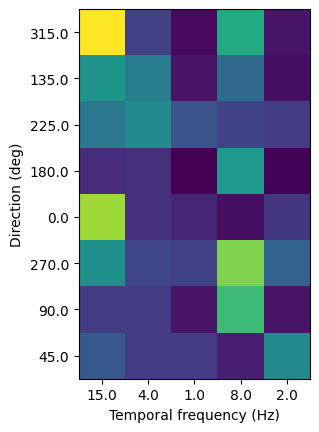

In [ ]:
response_mean = np.empty((len(orivals), len(tfvals)))
response_sem = np.empty((len(orivals), len(tfvals)))
for i,ori in enumerate(orivals):
    for j,tf in enumerate(tfvals):
        # First find the stimulus condition id for this combination of parameters
        # assign spike_mean to response_mean and response_sem
        # ...

plt.imshow(response_mean)
plt.xlabel("Temporal frequency (Hz)")
plt.ylabel("Direction (deg)")
plt.xticks(range(5), tfvals)
plt.yticks(range(8), orivals)
plt.show()

### Suggested exercises

If you would hands-on experience with the `EcephysSession` class, please consider working through some of these excercises.

- **tuning curves** : Pick a stimulus parameter, such as orientation on drifting gratings trials. Plot the mean and standard error of spike counts for each unit at each value of this parameter.
- **signal correlations** : Calculate unit-pairwise correlation coefficients on the tuning curves for a stimulus parameter of interest (`numpy.corrcoef` might be useful).
- **noise correlations** : Build for each unit a vector of spike counts across repeats of the same stimulus condition. Compute unit-unit correlation coefficients on these vectors.
- **cross-correlations** : Start with two spike trains. Call one of them "fixed" and the other "moving". Choose a set of time offsets and for each offset:
    1. apply the offset to the spike times in the moving train
    2. compute the correlation coefficient between the newly offset moving train and the fixed train.
    You should then be able to plot the obtained correlation coeffients as a function of the offset. 
- **unit clustering** : First, extract a set of unitwise features. You might draw these from the mean waveforms, for instance:
    - mean duration between waveform peak and trough (on the unit's peak channel)
    - the amplitude of the unit's trough
    
    or you might draw them from the unit's spike times, such as:
    - median inter-spike-interval
    
    or from metadata
    - CCF structure
    
    With your features in hand, attempt an unsupervised classification of the units. If this seems daunting, check out the [scikit-learn unsupervised learning documention](https://scikit-learn.org/stable/modules/clustering.html#clustering) for library code and examples.
- **population decoding** : Using an `EcephysSession` (and filtering to some stimuli and units of interest), build two aligned matrices:
    1. A matrix whose rows are stimulus presentations, columns are units, and values are spike counts.
    2. A matrix whose rows are stimulus presentations and whose columns are stimulus parameters.
    
    Using these matrices, train a classifier to predict stimulus conditions (sets of stimulus parameter values) from presentationwise population spike counts. See the [scikit-learn supervised learning tutorial](https://scikit-learn.org/stable/tutorial/statistical_inference/supervised_learning.html) for a guide to supervised learning in Python.

# Others

## Downloading the complete dataset

Analyzing one session at a time is nice, but in many case you'll want to be able to query across the whole dataset. To fill your cache with all available data, you can use a `for` loop like the one below. Note that we've added some checks to ensure that the complete file is present, in case the download has been interrupted due to an unreliable connection.

Before running this code, please make sure that you have enough space available in your cache directory. You'll need around 855 GB for the whole dataset, and 147 GB if you're not downloading the LFP data files.

In [ ]:
if DOWNLOAD_COMPLETE_DATASET:
    for session_id, row in sessions.iterrows():

        truncated_file = True
        directory = os.path.join(output_dir + '/session_' + str(session_id))

        while truncated_file:
            session = cache.get_session_data(session_id)
            try:
                print(session.specimen_name)
                truncated_file = False
            except OSError:
                shutil.rmtree(directory)
                print(" Truncated spikes file, re-downloading")

        for probe_id, probe in session.probes.iterrows():

            print(' ' + probe.description)
            truncated_lfp = True

            while truncated_lfp:
                try:
                    lfp = session.get_lfp(probe_id)
                    truncated_lfp = False
                except OSError:
                    fname = directory + '/probe_' + str(probe_id) + '_lfp.nwb'
                    os.remove(fname)
                    print("  Truncated LFP file, re-downloading")
                except ValueError:
                    print("  LFP file not found.")
                    truncated_lfp = False

## Accessing data on AWS

If you want to analyze the data without downloading anything to your local machine, you can use the AllenSDK on AWS.

Follow [these instructions](https://github.com/AllenInstitute/AllenSDK/wiki/Use-the-Allen-Brain-Observatory-%E2%80%93-Visual-Coding-on-AWS) to launch a Jupyter notebook. Then, simply point to the existing manifest file in the Allen Institute's S3 bucket, and all of the data will be immediately available:

Once your cache is initialized, you can create the `sessions` table, load individual `session` objects, and access LFP data using the same commands described above.

Additional tutorials specific to using AWS are coming soon.